# Face Completion

$\rightarrow$ Trying to guess the right half of the face given the left half using a Pix2Pix Gan

In [1]:
#import statements
import tensorflow as tf

import os
import time
import datetime
import random

import matplotlib.pyplot as plt
import matplotlib as mpl
import IPython.display

### Defining input pipeline

Images dataset used: <a href = 'https://www.kaggle.com/abhikjha/utk-face-cropped'>kaggle.com/abhikjha/utk-face-cropped</a>

In [2]:
IMAGES_PATH = './utkcropped/'
IMAGES = os.listdir(IMAGES_PATH)
random.shuffle(IMAGES)

In [3]:
TEST_TRAIN_SPLIT = 0.95
BATCH_SIZE = 16
IMG_WIDTH = 128
IMG_HEIGHT = 256
CHANNELS = 3

In [5]:
TRAIN_IMAGES, TEST_IMAGES = IMAGES[:int(len(IMAGES)*TEST_TRAIN_SPLIT)], IMAGES[int(len(IMAGES)*TEST_TRAIN_SPLIT):]
print('Number of train images:', len(TRAIN_IMAGES))
print('Number of test images:', len(TEST_IMAGES))

Number of train images: 22523
Number of test images: 1186


In [ ]:
with open('testlist.txt', 'w') as testlist:
    testlist.write('\n'.join(TEST_IMAGES))

In [6]:
#function to convert image file to single train example
def load(image_file, normalize = True):
    image = tf.io.read_file(image_file)
    image = tf.image.decode_jpeg(image)
    
    image = tf.image.resize(image, [IMG_HEIGHT, 2*IMG_WIDTH], method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)
    
    in_image, out_image = image[:, :IMG_WIDTH, :], image[:, IMG_WIDTH:, :]
    
    in_image = tf.cast(in_image, tf.float32)
    out_image = tf.cast(out_image, tf.float32)
    
    if normalize:
        in_image, out_image = (in_image / 127.5) - 1, (out_image / 127.5) - 1
    
    return in_image, out_image

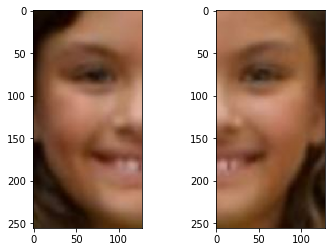

In [7]:
#example of a train example
idx = 1
inp, out = load(IMAGES_PATH+IMAGES[idx], normalize = False)

plt.subplot('121')
plt.imshow(inp/255.0)
plt.subplot('122')
plt.imshow(out/255.0)

In [0]:
#Define input pipeline for train set images from image names
train_dataset = tf.data.Dataset.from_tensor_slices([IMAGES_PATH+img for img in TRAIN_IMAGES])
train_dataset = train_dataset.map(load, num_parallel_calls = tf.data.experimental.AUTOTUNE)
train_dataset = train_dataset.batch(BATCH_SIZE)

In [0]:
#Define input pipeline for test set images from image names
test_dataset = tf.data.Dataset.from_tensor_slices([IMAGES_PATH+img for img in TEST_IMAGES])
test_dataset = test_dataset.map(load, num_parallel_calls = tf.data.experimental.AUTOTUNE)
test_dataset = test_dataset.batch(BATCH_SIZE)

## Define Model <br>
The model consists of a U-Net Generator and a CNN Discriminator<br>
### Generator

In [0]:
#1 Downsampling step
def downsample(filters, size, apply_batchnorm = True):
    result = tf.keras.Sequential()
    
    result.add(tf.keras.layers.Conv2D(filters, size, strides = 2, padding = 'same', use_bias = False))
    
    if apply_batchnorm:
        result.add(tf.keras.layers.BatchNormalization())
    
    result.add(tf.keras.layers.LeakyReLU())
    
    return result

In [0]:
def upsample(filters, size, apply_dropout = False):
    result = tf.keras.Sequential()
    
    result.add(tf.keras.layers.Conv2DTranspose(filters, size, strides = 2, padding = 'same', use_bias = False))
    result.add(tf.keras.layers.BatchNormalization())
    
    if apply_dropout:
        result.add(tf.keras.layers.Dropout(0.5))
        
    result.add(tf.keras.layers.ReLU())
    
    return result

In [0]:
def Generator():
    inputs = tf.keras.layers.Input(shape = (IMG_HEIGHT, IMG_WIDTH, CHANNELS))
    encoding = [
        downsample(64, 4, apply_batchnorm = False), #(None, 128, 64, 64)
        downsample(128, 4), #(None, 64, 32, 128)
        downsample(256, 4), #(None, 32, 16, 256)
        downsample(512, 4), #(None, 16, 8, 512)
        downsample(512, 4), #(None, 8, 4, 512)
        downsample(512, 4), #(None, 4, 2, 512)
        downsample(512, 4), #(None, 2, 1, 512)
    ]
    
    decoding = [
        upsample(512, 4, apply_dropout = False), #(None, 4, 2, 512*2)
        upsample(512, 4, apply_dropout = False), #(None, 8, 4, 512*2)
        upsample(512, 4), #(None, 16, 8, 512*2)
        upsample(256, 4), #(None, 32, 16, 256*2)
        upsample(128, 4), #(None, 64, 32, 128*2)
        upsample(64, 4) #(None, 128, 64, 64*2)
    ]
    
    last = tf.keras.layers.Conv2DTranspose(CHANNELS, 4, strides = 2, padding = 'same', activation = 'tanh')
    #(None, 256, 128, 3)
    
    x = inputs
    
    skip_connections = []
    for down in encoding:
        x = down(x)
        skip_connections.append(x)
        
    skip_connections = reversed(skip_connections[:-1])
    
    for up, skip in zip(decoding, skip_connections):
        x = up(x)
        x = tf.keras.layers.Concatenate()([x, skip])
    
    x = last(x)
    
    return tf.keras.Model(inputs = inputs, outputs = x)

In [0]:
generator = Generator()
generator.save('generator.h5')

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


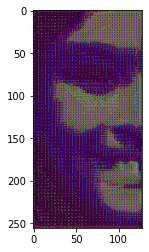

(1, 256, 128, 3)


In [16]:
gen_output = generator(inp[tf.newaxis,...]/127.5 - 1, training=False)
plt.imshow( tf.cast((gen_output[0, ...] + 1)*127.5, tf.int8) )
plt.show()
print(gen_output.shape)

### Generator Loss

In [0]:
LAMBDA = 100

In [0]:
loss_object = tf.keras.losses.BinaryCrossentropy(from_logits=True)

In [0]:
def generator_loss(disc_gen_output, gen_output, target):
    disc_gen_loss = loss_object(tf.ones_like(disc_gen_output), disc_gen_output)
    
    l1_gen_loss = tf.reduce_mean(tf.abs(target - gen_output))
    
    total_gen_loss = disc_gen_loss + l1_gen_loss*LAMBDA
    
    return total_gen_loss, disc_gen_loss, l1_gen_loss

### Discriminator

In [0]:
def Discriminator():
    src = tf.keras.layers.Input(shape = (256, 128, 3), name = 'source_image')
    tar = tf.keras.layers.Input(shape = (256, 128, 3), name = 'target_image')
    
    x = tf.keras.layers.concatenate([src, tar]) #(None, 256, 128, 3*2)
    
    x = downsample(64, 4, apply_batchnorm = False)(x) #(None, 128, 64, 64)
    x = downsample(128, 4)(x) #(None, 64, 32, 128)
    x = downsample(256, 4)(x) #(None, 32, 16, 256)
    
    x = tf.keras.layers.ZeroPadding2D()(x) #(None, 34, 18, 256)
    
    x = tf.keras.layers.Conv2D(512, 4, strides=1, use_bias=False)(x) #(None, 31, 15, 512)
    x = tf.keras.layers.BatchNormalization()(x) #same
    x = tf.keras.layers.LeakyReLU()(x) #same
    
    x = tf.keras.layers.ZeroPadding2D()(x) #(None, 33, 17, 512)
    
    x = tf.keras.layers.Conv2D(1, 4, strides=1)(x) #(None, 30, 14, 1)
    
    #not normalized as loss is taken from logits
    
    return tf.keras.Model(inputs = [src, tar], outputs = x)

In [0]:
discriminator = Discriminator()
discriminator.save('discriminator.h5')

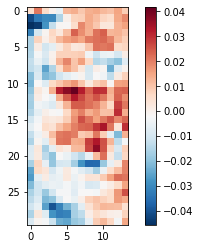

In [23]:
disc_out = discriminator([inp[tf.newaxis,...]/127.5 - 1, gen_output], training=False)
plt.imshow(disc_out[0,...,-1], vmin=tf.reduce_min(disc_out), vmax=tf.reduce_max(disc_out), cmap='RdBu_r')
plt.colorbar()

### Discriminator Loss

In [0]:
def discriminator_loss(disc_real_output, disc_gen_output):
    disc_real_loss = loss_object(tf.ones_like(disc_real_output), disc_real_output)
    disc_gen_loss = loss_object(tf.zeros_like(disc_gen_output), disc_gen_output)
    
    total_disc_loss = disc_real_loss + disc_gen_loss
    
    return total_disc_loss

### Optimizers

In [0]:
generator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
discriminator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

In [0]:
# Tensorflow Checkpoint object to save data while training
checkpoint_dir = './training_checkpoints'
checkpoint_prefix = os.path.join(checkpoint_dir, "ckpt")
checkpoint = tf.train.Checkpoint(
    generator_optimizer=generator_optimizer,
    discriminator_optimizer=discriminator_optimizer,
    generator=generator,
    discriminator=discriminator
)

In [7]:
#function to plot 1 input output pair
def generate_images(model, test_src, tar):
    prediction = model(test_src, training = True)
    
    fig = plt.figure()
    fig.set_size_inches(16.5, 5.5)
    gs = mpl.gridspec.GridSpec(2, 10, figure = fig)
    
    ax1 = fig.add_subplot(gs[:, 0:2])
    ax1.title = plt.title('Input')
    ax1.imshow(test_src[0]*0.5 + 0.5, vmin = 0, vmax = 1)
    ax1.axis('off')
    
    ax2 = fig.add_subplot(gs[:, 2:6])
    ax2.title = plt.title('Ground Truth')
    ax2.imshow(tf.concat([test_src[0], tar[0]], axis = 1)*0.5 + 0.5, vmin = 0, vmax = 1)
    ax2.axis('off')
    
    ax3 = fig.add_subplot(gs[:, 6:10])
    ax3.title = plt.title('Prediction')
    ax3.imshow(tf.concat([test_src[0], prediction[0]], axis = 1)*0.5 + 0.5, vmin = 0, vmax = 1)
    ax3.axis('off')
    
    
    plt.show()

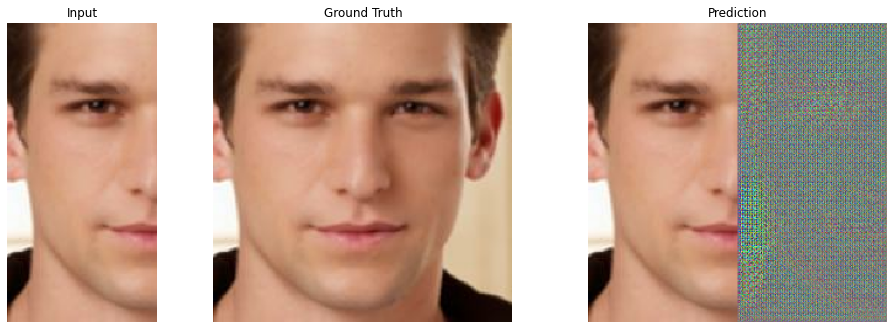

In [28]:
for ex_src, ex_tar in test_dataset.take(1):
    generate_images(generator, ex_src, ex_tar)

In [0]:
#Logging for Tensorboard
log_dir = "logs/"

summary_writer = tf.summary.create_file_writer(log_dir + "fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))

In [0]:
#Train Step
@tf.function
def train_step(src_image, tar_image, epoch):
    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        gen_output = generator(src_image, training = True)
        
        disc_real_output = discriminator([src_image, tar_image], training = True)
        disc_gen_output = discriminator([src_image, gen_output], training = True)
        
        gen_total_loss, gen_gan_loss, gen_l1_loss = generator_loss(disc_gen_output, gen_output, tar_image)
        disc_loss = discriminator_loss(disc_real_output, disc_gen_output)
    
    gen_grads = gen_tape.gradient(gen_total_loss, generator.trainable_variables)
    disc_grads = disc_tape.gradient(disc_loss, discriminator.trainable_variables)
    
    generator_optimizer.apply_gradients(zip(gen_grads, generator.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(disc_grads, discriminator.trainable_variables))
    
    with summary_writer.as_default():
        tf.summary.scalar('gen_total_loss', gen_total_loss, step = epoch)
        tf.summary.scalar('gen_gan_loss', gen_gan_loss, step = epoch)
        tf.summary.scalar('gen_l1_loss', gen_l1_loss, step = epoch)
        tf.summary.scalar('disc_loss', disc_loss, step = epoch)

In [0]:
#function to call train step multiple times
def fit(train_ds, epochs, test_ds):
    for epoch in range(epochs):
        start = time.time()
        
        IPython.display.clear_output(wait = True)
        
        for ex_src, ex_tar in test_ds.take(1):
            generate_images(generator, ex_src, ex_tar)
        print('Epoch:', epoch+1)
        
        for n, (src_image, tar_image) in train_ds.enumerate():
            if (n+1)%100 == 0:
                print('>', end = '')
            train_step(src_image, tar_image, epoch)
        print()
        
        checkpoint.save(file_prefix = checkpoint_prefix)
            
        print('Completed epoch {} in {} sec'.format(epoch+1, time.time()-start))
    
    checkpoint.save(file_prefix = checkpoint_prefix)

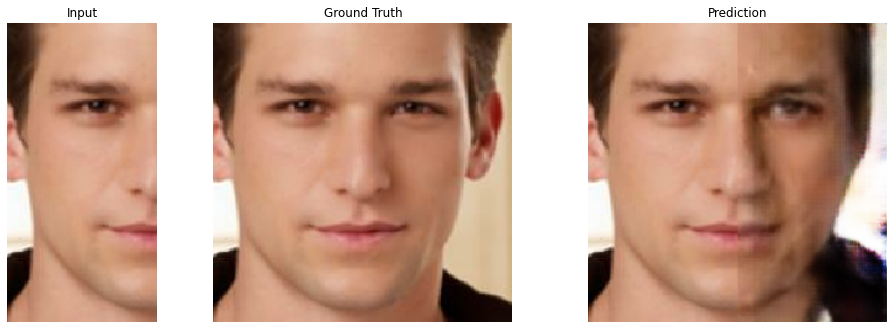

Epoch: 15
>>>>>>>>>>>>>>
Completed epoch 15 in 391.72898602485657 sec


In [33]:
#training
EPOCHS = 15
fit(train_dataset, EPOCHS, test_dataset)

In [32]:
#tensorboard used while training (ignore)
%load_ext tensorboard
%tensorboard --logdir {log_dir}

Reusing TensorBoard on port 6006 (pid 2626), started 0:20:19 ago. (Use '!kill 2626' to kill it.)

<IPython.core.display.Javascript object>

## Reload Model after training
REQUIRES: generator.h5, discriminator.h5, atleast one checkpoint in './training_checkpoints', testlist.txt and utk-cropped dataset in ./utkcropped<br>
This model was trained for $30$ epochs

In [4]:
generator = tf.keras.models.load_model('generator.h5', compile = False)
discriminator = tf.keras.models.load_model('discriminator.h5', compile = False)

generator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
discriminator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

checkpoint_dir = './training_checkpoints'
checkpoint_prefix = os.path.join(checkpoint_dir, "ckpt")
checkpoint = tf.train.Checkpoint(
    generator_optimizer=generator_optimizer,
    discriminator_optimizer=discriminator_optimizer,
    generator=generator,
    discriminator=discriminator
)

with open('testlist.txt') as testlist:
    TEST_IMAGES = list(map(str.strip, testlist.readlines()))

checkpoint.restore(tf.train.latest_checkpoint(checkpoint_dir))

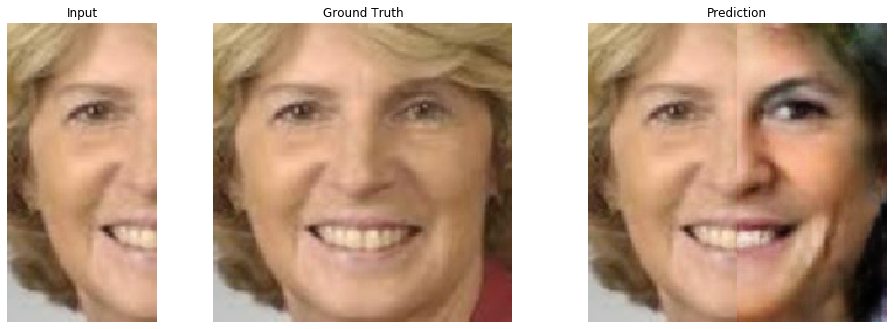

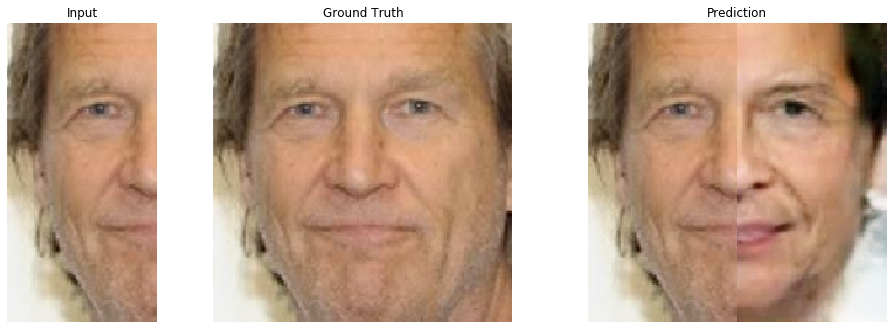

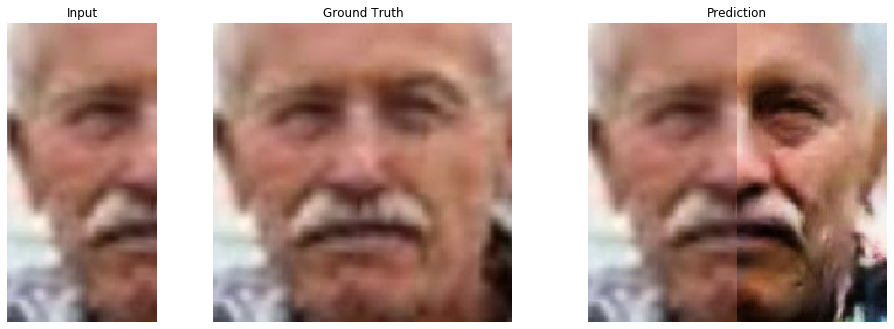

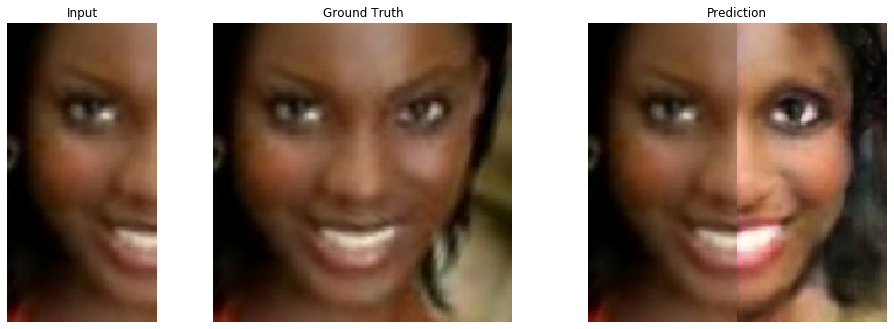

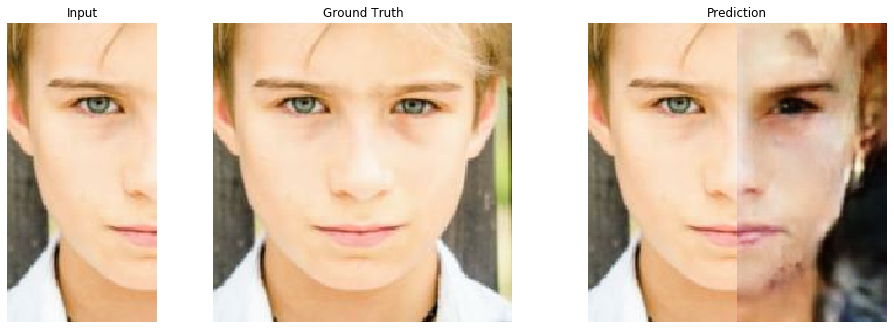

...

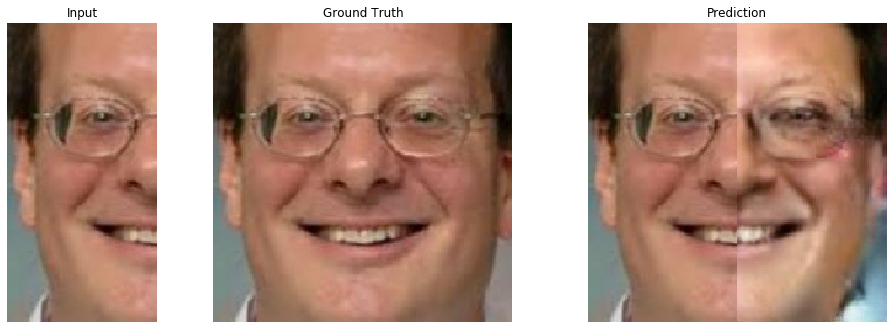

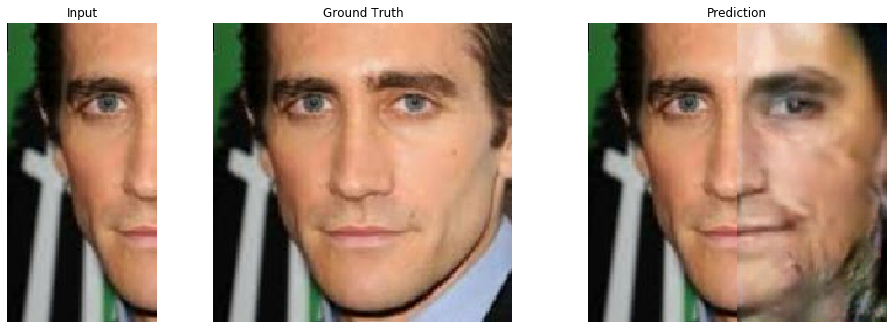

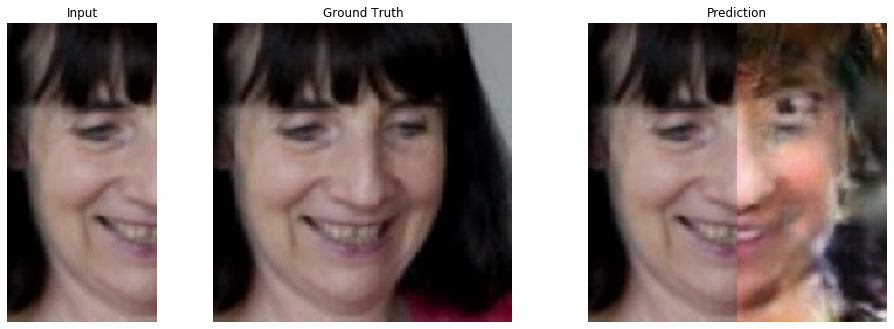

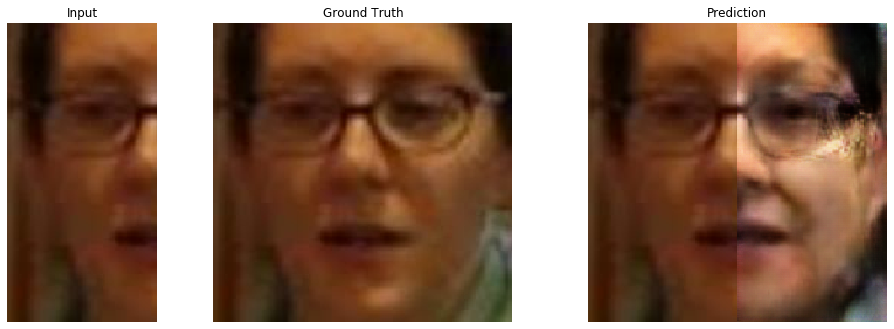

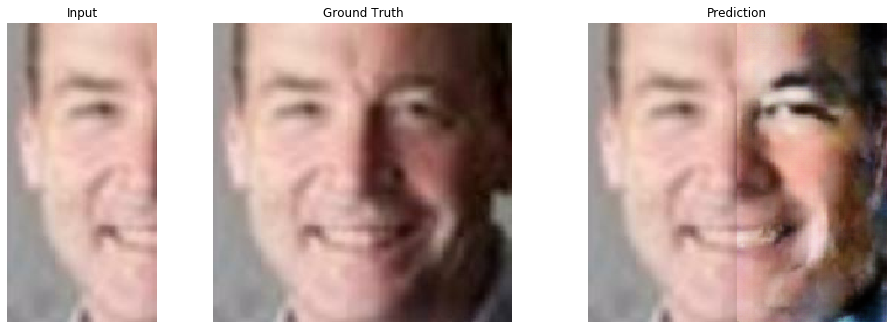

In [11]:
#some predictions
for test_src, test_tar in [load(IMAGES_PATH + TEST_IMAGES[random.randint(0, len(TEST_IMAGES) - 1)], normalize = True) for i in range(20)]:
    generate_images(generator, test_src[tf.newaxis, ...], test_tar[tf.newaxis, ...])

References:
<ul>
    <li>
        <a href = 'https://www.tensorflow.org/tutorials/generative/pix2pix'>
            tensorflow.org/tutorials/generative/pix2pix
        </a>
    </li>
    <li>
        <a href = 'https://machinelearningmastery.com/how-to-develop-a-pix2pix-gan-for-image-to-image-translation/'>
        machinelearningmastery.com/how-to-develop-a-pix2pix-gan-for-image-to-image-translation/
        </a>
    </li>
</ul>